## Problem - 1
Context:

The comp-activ database comprises activity measures of computer systems. Data was gathered from a Sun Sparcstation 20/712 with 128 Mbytes of memory, operating in a multi-user university department. Users engaged in diverse tasks, such as internet access, file editing, and CPU-intensive programs.

Being an aspiring data scientist, you aim to establish a linear equation for predicting 'usr' (the percentage of time CPUs operate in user mode). Your goal is to analyze various system attributes to understand their influence on the system's 'usr' mode.


In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_excel("compactiv.xlsx")

In [3]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [4]:
df.shape

(8192, 22)

In [5]:
df.describe()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
count,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.088000e+03,8.177000e+03,8192.000000,...,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8192.000000
mean,19.559692,13.106201,2306.318237,210.479980,150.058228,1.884554,2.791998,1.973857e+05,9.590299e+04,2.285317,...,11.919712,21.526849,1.127505,8.277960,12.388586,109.793799,185.315796,1763.456299,1.328126e+06,83.968872
std,53.353799,29.891726,1633.617322,198.980146,160.478980,2.479493,5.212456,2.398375e+05,1.408417e+05,5.307038,...,32.363520,71.141340,5.708347,13.874978,22.281318,114.419221,191.000603,2482.104511,4.220194e+05,18.401905
min,0.000000,0.000000,109.000000,6.000000,7.000000,0.000000,0.000000,2.780000e+02,1.498000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,55.000000,2.000000e+00,0.000000
25%,2.000000,0.000000,1012.000000,86.000000,63.000000,0.400000,0.200000,3.409150e+04,2.291600e+04,0.000000,...,0.000000,0.000000,0.000000,0.600000,0.600000,25.000000,45.400000,231.000000,1.042624e+06,81.000000
50%,7.000000,1.000000,2051.500000,166.000000,117.000000,0.800000,1.200000,1.254735e+05,4.661900e+04,0.000000,...,0.000000,0.000000,0.000000,2.800000,3.800000,63.800000,120.400000,579.000000,1.289290e+06,89.000000
75%,20.000000,10.000000,3317.250000,279.000000,185.000000,2.200000,2.800000,2.678288e+05,1.061010e+05,2.400000,...,5.000000,0.000000,0.600000,9.765000,13.800000,159.600000,251.800000,2002.250000,1.730380e+06,94.000000
max,1845.000000,575.000000,12493.000000,5318.000000,5456.000000,20.120000,59.560000,2.526649e+06,1.801623e+06,81.440000,...,523.000000,1237.000000,211.580000,141.200000,292.610000,899.800000,1365.000000,12027.000000,2.243187e+06,99.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [7]:
df.drop(['pgout','ppgout','pgfree','pgscan','atch'], axis=1, inplace=True)

In [8]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

There is some missing values in rchar and wchar

In [9]:
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


In [10]:
median_1= df['wchar'].median()
df['wchar'] = df['wchar'].replace(np.nan,median_1)

In [11]:
median_1= df['rchar'].median()
df['rchar'] = df['rchar'].replace(np.nan,median_1)
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [12]:
df_num= df.select_dtypes(include= ['float64', 'int64'])

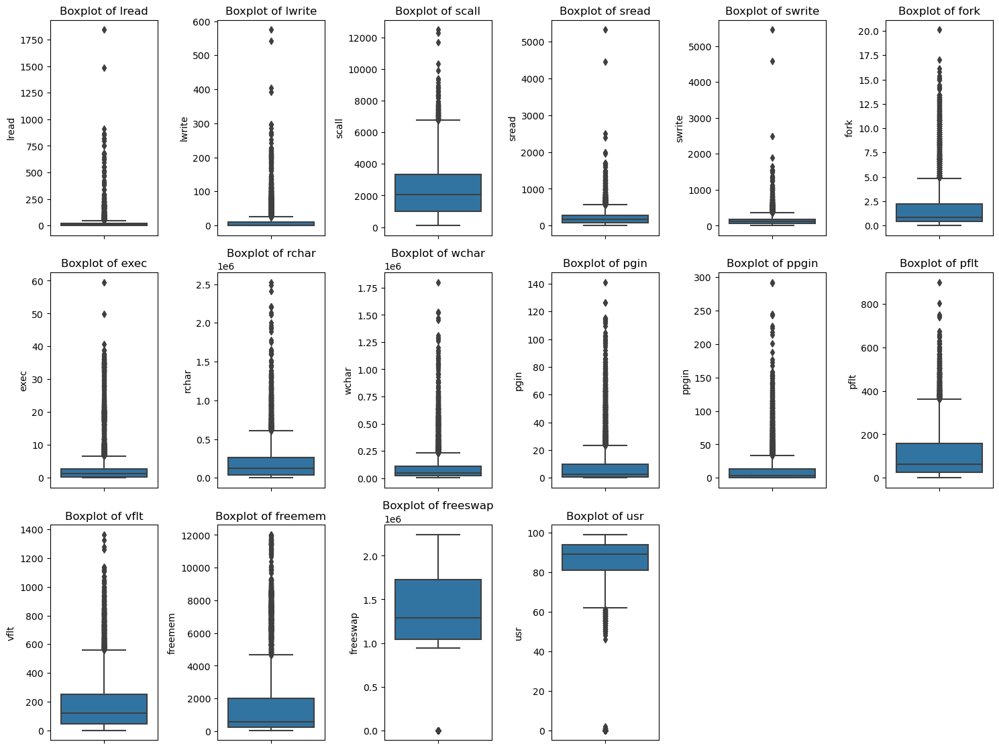

In [13]:
plt.figure(figsize=(15,15))
feature_list= df_num.columns
for i in range(len(feature_list)):
    plt.subplot(4, 6, i+1) 
    sns.boxplot(y=df_num[feature_list[i]],data=df_num) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()

In [14]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [15]:
for column in df_num.columns:
    lr,ur=remove_outlier(df_num[column])
    df_num[column]=np.where(df_num[column]>ur,ur,df_num[column])
    df_num[column]=np.where(df_num[column]<lr,lr,df_num[column])

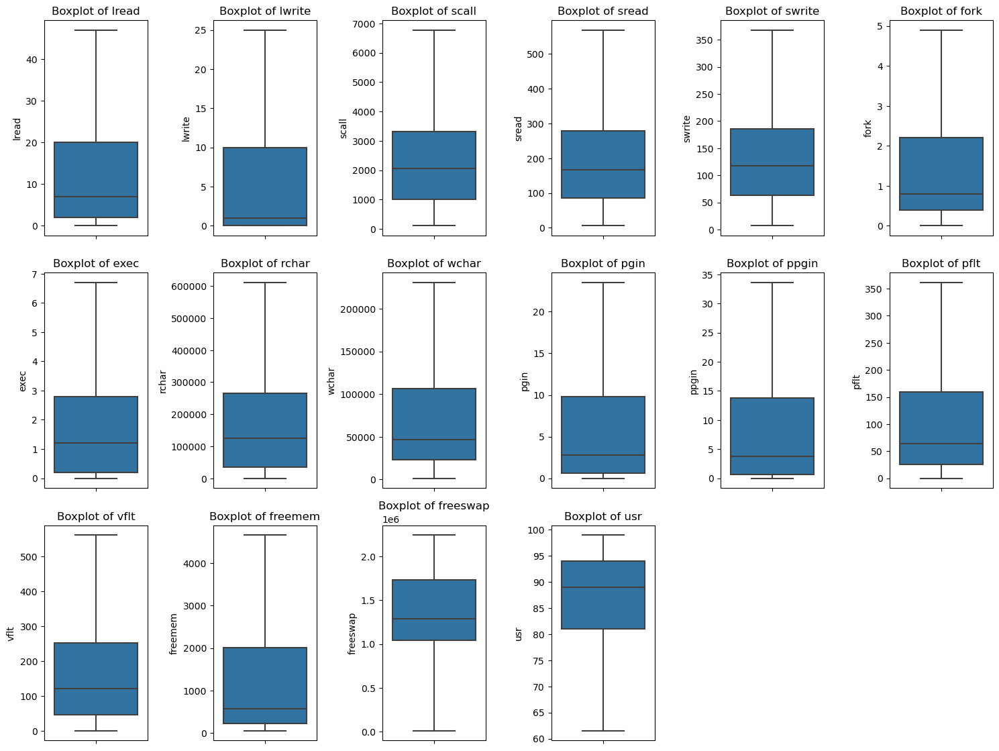

In [16]:
plt.figure(figsize=(15,15))
feature_list= df_num.columns
for i in range(len(feature_list)):
    plt.subplot(4, 6, i+1) 
    sns.boxplot(y=df_num[feature_list[i]],data=df_num) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()

<Axes: xlabel='runqsz', ylabel='count'>

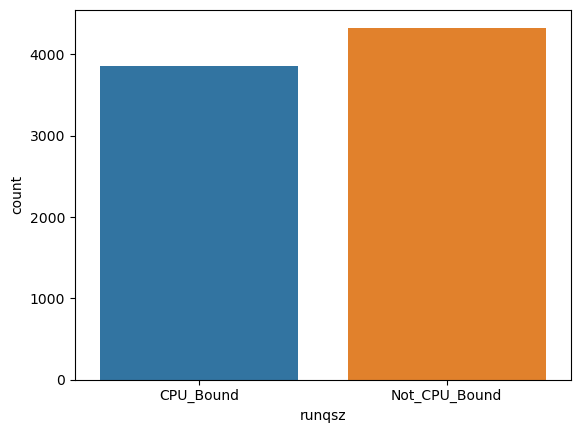

In [18]:
sns.countplot(data=df, x='runqsz')

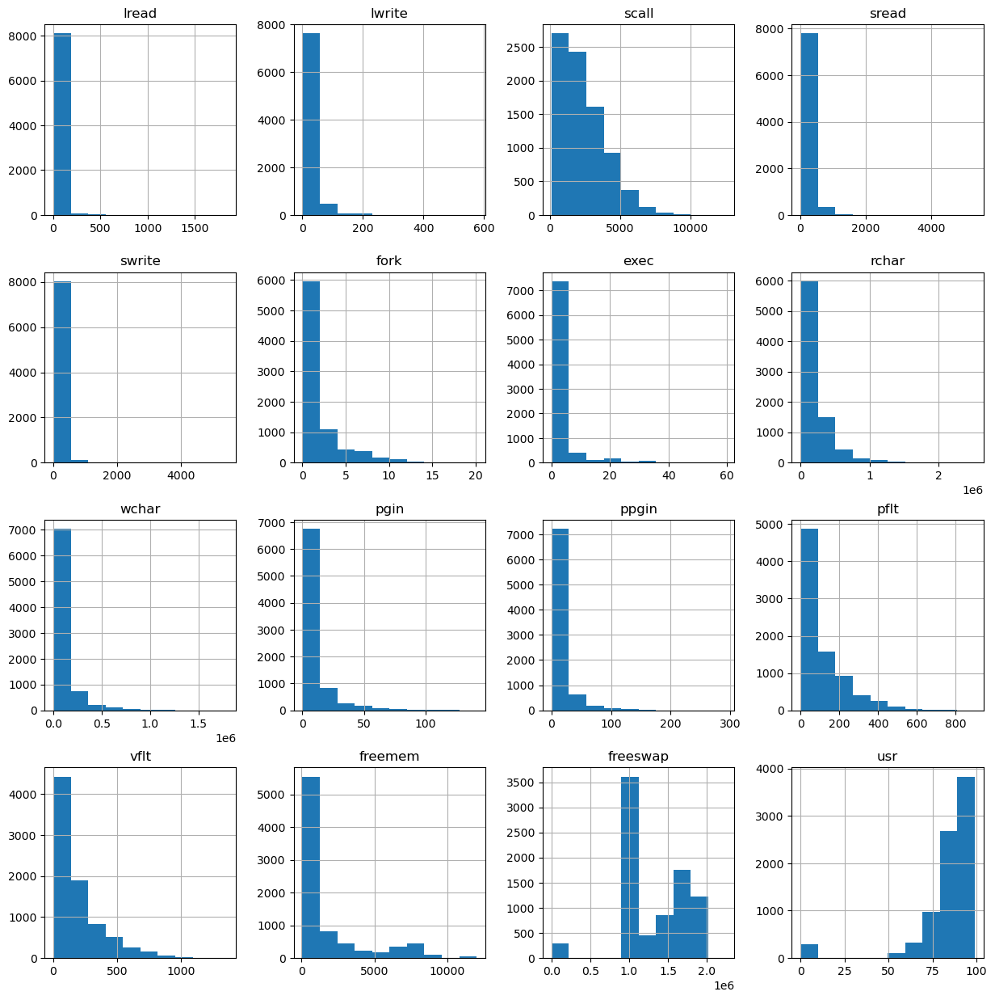

In [18]:
df.hist(figsize=(15,15))
plt.show()

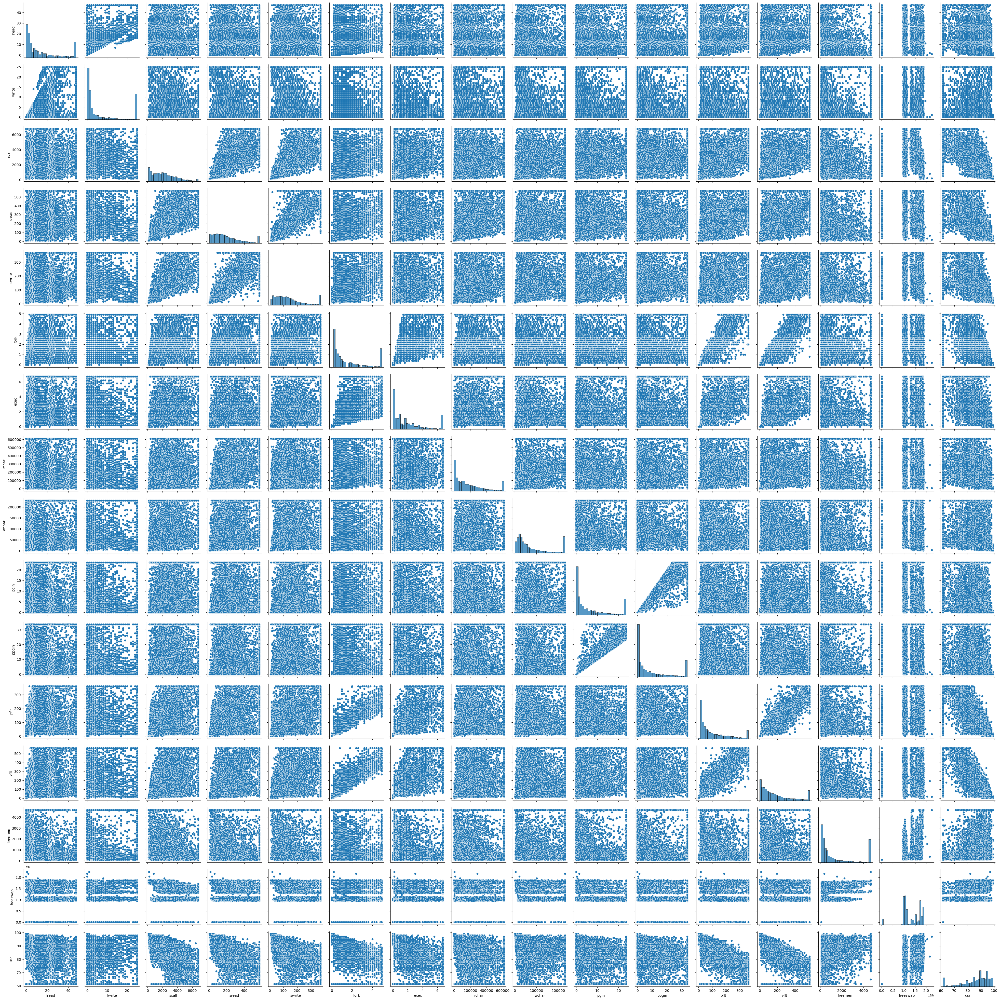

In [19]:
sns.pairplot(df_num)

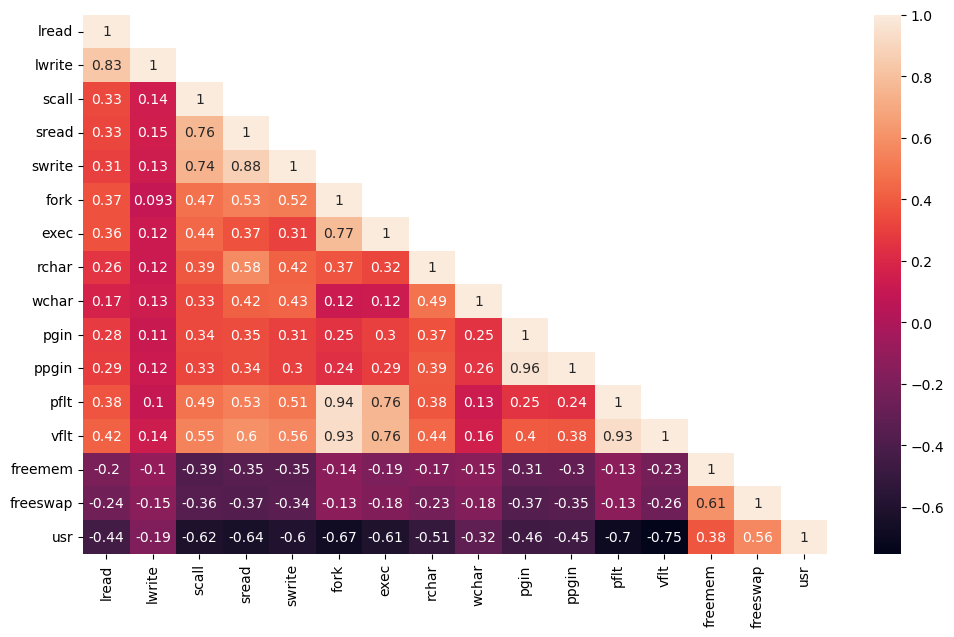

In [20]:
plt.figure(figsize=(12,7))
sns.heatmap(df_num.corr(), annot=True,mask=np.triu(df_num.corr(),+1));
plt.show()

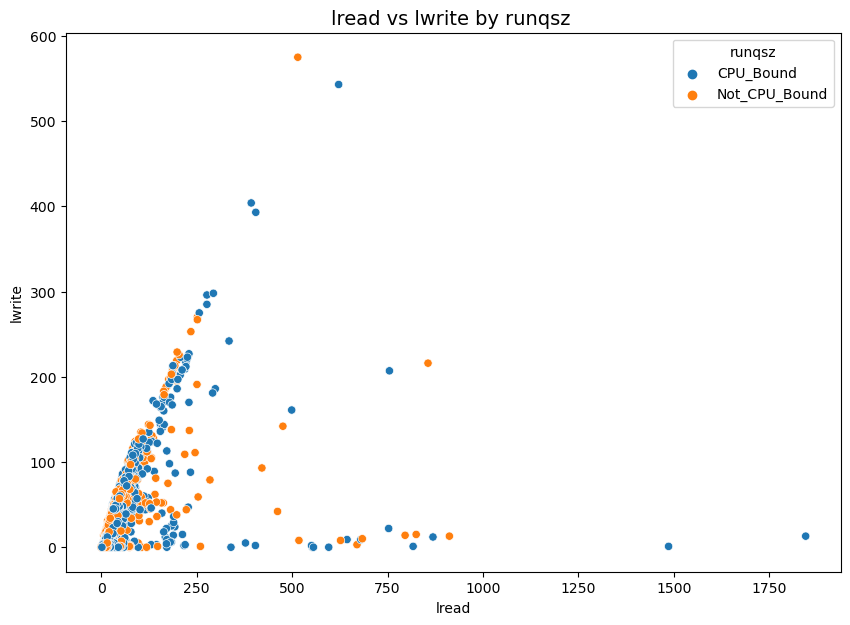

In [21]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='lread', y= 'lwrite',data=df,hue='runqsz')
plt.title('lread vs lwrite by runqsz ',fontsize=14)
plt.show()

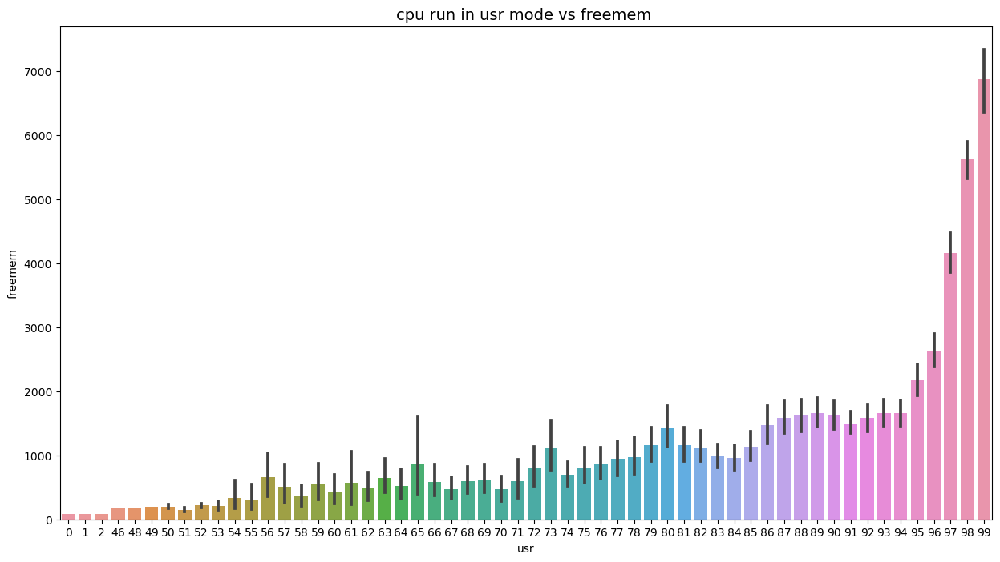

In [22]:
fig_dims=(15,8)
fig= plt.subplots(figsize=fig_dims)
sns.barplot(x='usr',y='freemem', data= df)
plt.title('cpu run in usr mode vs freemem ',fontsize=14)
plt.show()

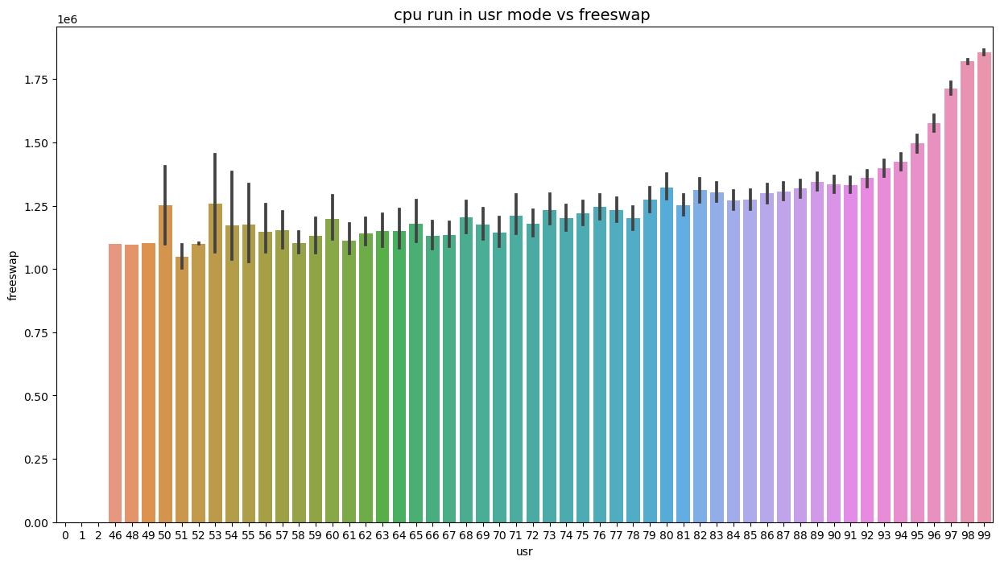

In [23]:
fig_dims=(15,8)
fig= plt.subplots(figsize=fig_dims)
sns.barplot(x='usr',y='freeswap', data= df)
plt.title('cpu run in usr mode vs freeswap ',fontsize=14)
plt.show()

In [24]:
df = pd.get_dummies(df, columns=['runqsz'],drop_first=True)

In [25]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,1.6,2.6,16.00,26.40,4670,1730946,95,False
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,0.0,15.63,16.83,7278,1869002,97,True
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,6.0,9.4,150.20,220.20,702,1021237,87,True
3,0,0,160,12,16,0.2,0.2,125473.5,8670.0,0.2,0.2,15.60,16.80,7248,1863704,98,True
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,1.0,1.2,37.80,47.60,633,1760253,90,True


In [26]:
df.runqsz_Not_CPU_Bound = df.runqsz_Not_CPU_Bound.replace({True: 1, False: 0})

In [27]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,125473.5,8670.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,1.0,1.2,37.80,47.60,633,1760253,90,1


In [28]:
X= df.drop('usr', axis=1)
y= df[['usr']]

In [29]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,1.6,2.6,16.00,26.40,4670,1730946,0
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,0.0,15.63,16.83,7278,1869002,1
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,6.0,9.4,150.20,220.20,702,1021237,1
3,0,0,160,12,16,0.2,0.2,125473.5,8670.0,0.2,0.2,15.60,16.80,7248,1863704,1
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,1.0,1.2,37.80,47.60,633,1760253,1


In [30]:
y.head()

,usr
0,95
1,97
2,87
3,98
4,90


### Linear Regression using (sklearn)

In [31]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.30 , random_state=1)

In [32]:
regression_model= LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [33]:
regression_model.coef_

array([[-1.90710288e-02,  5.35168023e-03,  1.05547258e-03,
        -2.12080719e-04, -2.10671177e-03, -1.47636022e+00,
        -8.29109301e-02, -4.15719647e-06, -1.25501025e-05,
         9.92607859e-02, -8.15273807e-02, -3.94524835e-02,
         1.65275683e-02, -1.54861264e-03,  3.21715558e-05,
         7.71965251e+00]])

In [34]:
for idx, col_name in enumerate(X_train.columns): 
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lread is -0.019071028755697227
The coefficient for lwrite is 0.005351680234797432
The coefficient for scall is 0.001055472579630501
The coefficient for sread is -0.00021208071937424189
The coefficient for swrite is -0.0021067117728486187
The coefficient for fork is -1.4763602150199384
The coefficient for exec is -0.08291093008151607
The coefficient for rchar is -4.157196469612707e-06
The coefficient for wchar is -1.2550102544464761e-05
The coefficient for pgin is 0.09926078587600311
The coefficient for ppgin is -0.08152738074387948
The coefficient for pflt is -0.039452483469801326
The coefficient for vflt is 0.016527568288448636
The coefficient for freemem is -0.001548612638193951
The coefficient for freeswap is 3.217155579563892e-05
The coefficient for runqsz_Not_CPU_Bound is 7.719652511935815


In [35]:
intercept= regression_model.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is 44.5352398501066


In [36]:
# R square on training data
regression_model.score(X_train, y_train)

0.6396208032522488

In [37]:
# R square on testing data
regression_model.score(X_test, y_test)

0.6278183987649504

In [38]:
#RMSE on Training data
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

10.861830451296033

In [39]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

11.64731665988237

### Linear Regression using statsmodel(OLS)

In [40]:
import statsmodels.api as sm
X_train=sm.add_constant(X_train)
X_test=sm.add_constant(X_test)

In [41]:
model = sm.OLS(y_train,X_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.639
Method:                 Least Squares   F-statistic:                     634.2
Date:                Thu, 18 Jan 2024   Prob (F-statistic):               0.00
Time:                        18:36:39   Log-Likelihood:                -21813.
No. Observations:                5734   AIC:                         4.366e+04
Df Residuals:                    5717   BIC:                         4.377e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   44.5352 

In [42]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   26.517423
lread                    1.442854
lwrite                   1.404792
scall                    2.397895
sread                    6.753642
swrite                   5.295278
fork                    17.681048
exec                     3.048912
rchar                    1.960720
wchar                    1.510075
pgin                     7.822488
ppgin                    7.494497
pflt                    11.677613
vflt                    18.405139
freemem                  1.641281
freeswap                 1.732284
runqsz_Not_CPU_Bound     1.115316
dtype: float64



In [43]:
y_pred_test = model.predict(X_test)
y_pred_train = model.predict(X_train)

In [44]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
rmse1 = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse1

10.861830451296033

In [45]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred_test))
rmse2

11.647316659882758

1.4 Inference: Basis on these predictions, what are the business insights andrecommendations.
----- 
freeswapWhen ppgout increases by 1 unit, usr increases by0.1 

units keeping all otherpredictors constant.Whenpgscanincreases by 1 unit, 

usr increases by0.01 units keeping all otherpredictors constantWhenpginincreases by 1 unit, 

usr increases by0.09 units keeping all otherpredictors constantWhenvfltincreases by 1 unit, 

usr increases by0.02 units keeping all otherpredictors constant

DATA INSIGHTS:
----
1. Using the p>|t| result, we can say that the variables like lwrite, sread,swrite,pgscan are statistically insignificant variables as ther p-value is greater than0.05.
2. Omnibus test checks the normality of the residuals once the model isdeployed. Here prob(omnibus) is 0 indicating that there is 0% chance that theresiduals are normally distributed. For a model to be robust the residualdistribution is also required to be normal ideally apart from checking r-squared and other parameters.
3. This indicates our model is not robust and not fit.4. Also there are very strong multicollinearity present in the dataset

### Problem - 2
Objective
In your role as a statistician at the Republic of Indonesia Ministry of Health, you have been entrusted with a dataset containing information from a Contraceptive Prevalence Survey. This dataset encompasses data from 1473 married females who were either not pregnant or were uncertain of their pregnancy status during the survey.

Your task involves predicting whether these women opt for a contraceptive method of choice. This prediction will be based on a comprehensive analysis of their demographic and socio-economic attributes.

Data Description
------------------------
Wife's age (numerical)

Wife's education (categorical) 1=uneducated, 2, 3, 4=tertiary

Husband's education (categorical) 1=uneducated, 2, 3, 4=tertiary

Number of children ever born (numerical)

Wife's religion (binary) Non-Scientology, Scientology

Wife's now working? (binary) Yes, No

Husband's occupation (categorical) 1, 2, 3, 4(random)

Standard-of-living index (categorical) 1=verlow, 2, 3, 4=high

Media exposure (binary) Good, Not good

Contraceptive method used (class attribute) No,Yes

In [46]:
df1=pd.read_excel("Contraceptive_method_dataset.xlsx")

In [47]:
df1.shape

(1473, 10)

In [48]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [49]:
df1.describe()

,Wife_age,No_of_children_born,Husband_Occupation
count,1402.000000,1452.000000,1473.000000
mean,32.606277,3.254132,2.137814
std,8.274927,2.365212,0.864857
min,16.000000,0.000000,1.000000
25%,26.000000,1.000000,1.000000
50%,32.000000,3.000000,2.000000
75%,39.000000,4.000000,3.000000
max,49.000000,16.000000,4.000000


### Univariate analysis for categorical data`

<Axes: xlabel='Wife_ education', ylabel='count'>

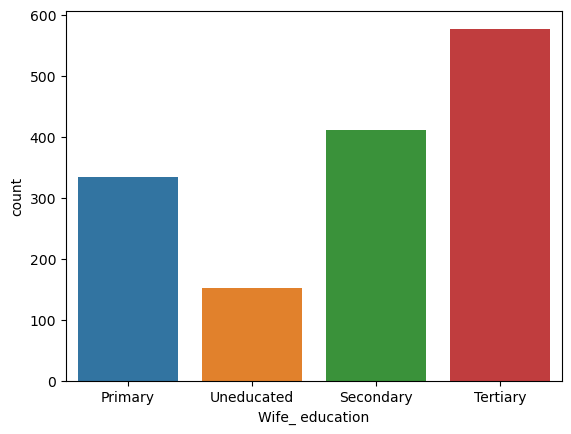

In [50]:
sns.countplot(df1, x = 'Wife_ education')

<Axes: xlabel='Wife_religion', ylabel='count'>

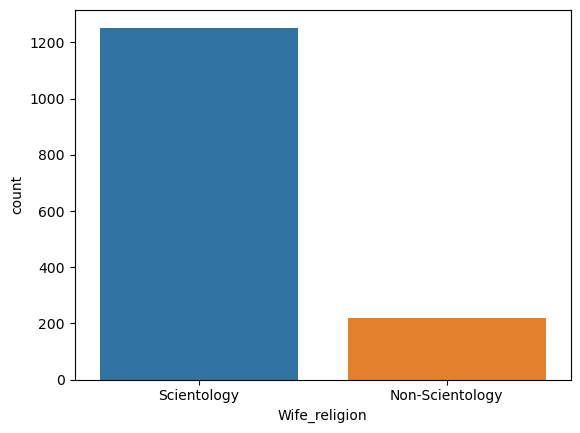

In [51]:
sns.countplot(df1, x ='Wife_religion')

<Axes: xlabel='Wife_Working', ylabel='count'>

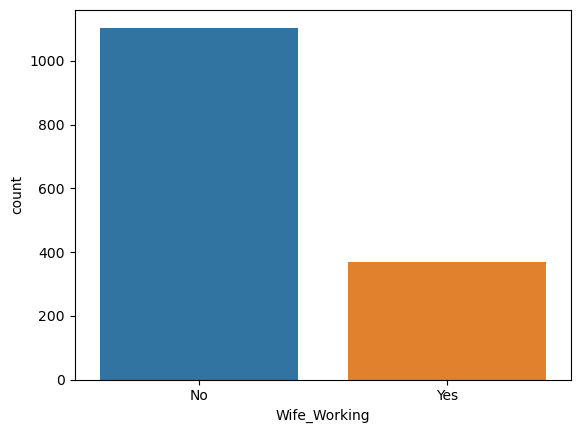

In [52]:
sns.countplot(df1, x = 'Wife_Working')

<Axes: xlabel='Standard_of_living_index', ylabel='count'>

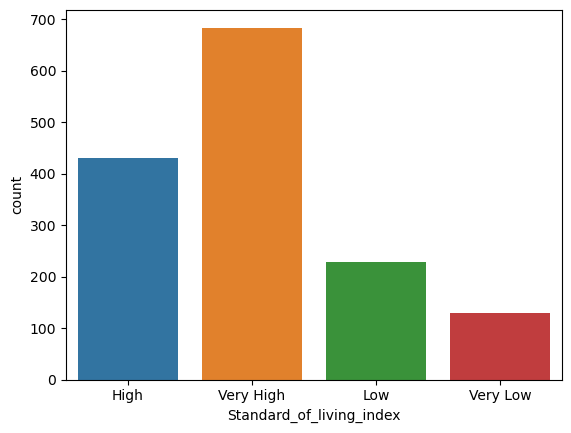

In [53]:
sns.countplot(df1, x = 'Standard_of_living_index')

<Axes: xlabel='Husband_education', ylabel='count'>

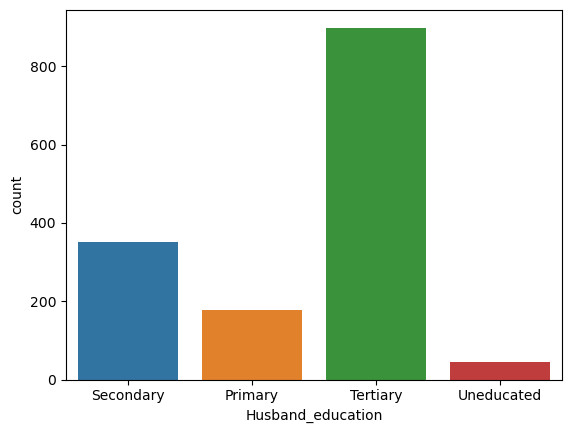

In [54]:
sns.countplot(df1,x='Husband_education')

<Axes: xlabel='Contraceptive_method_used', ylabel='count'>

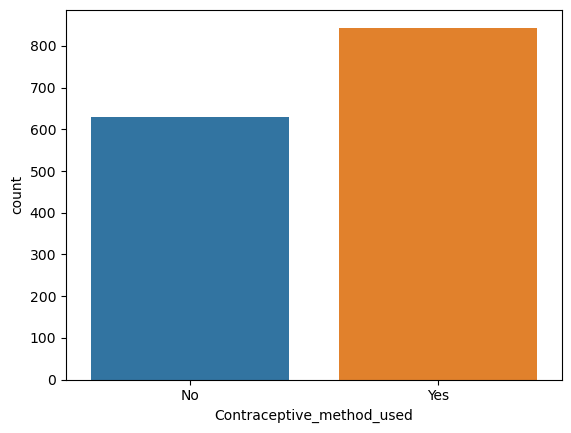

In [55]:
sns.countplot(df1,x='Contraceptive_method_used')

### Multivariate analysis

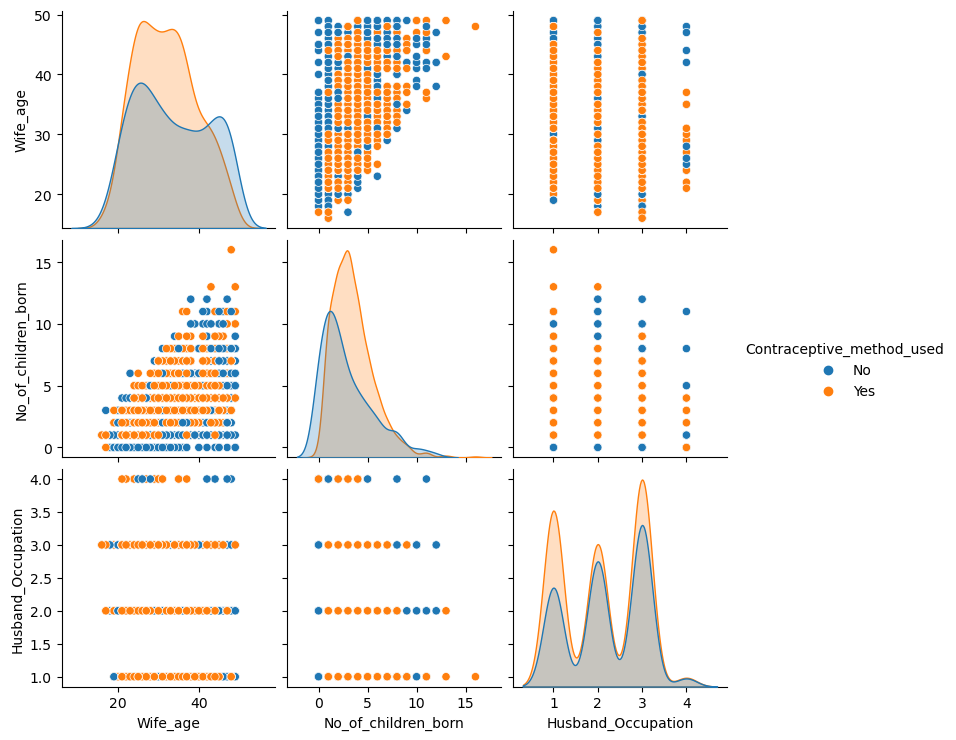

In [56]:
sns.pairplot(data=df1,hue='Contraceptive_method_used')

<Axes: xlabel='Husband_education', ylabel='count'>

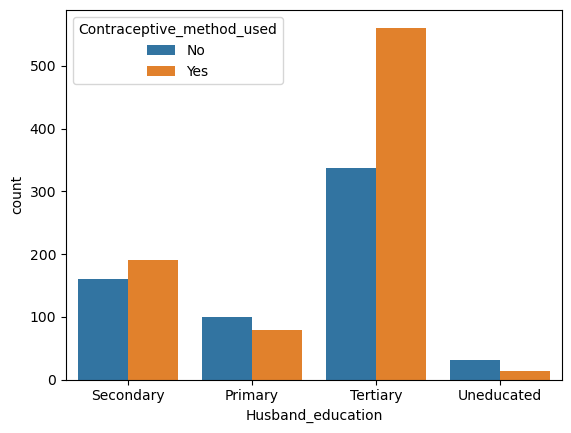

In [57]:
sns.countplot(data=df1 , x='Husband_education',hue='Contraceptive_method_used')

<Axes: xlabel='Wife_ education', ylabel='count'>

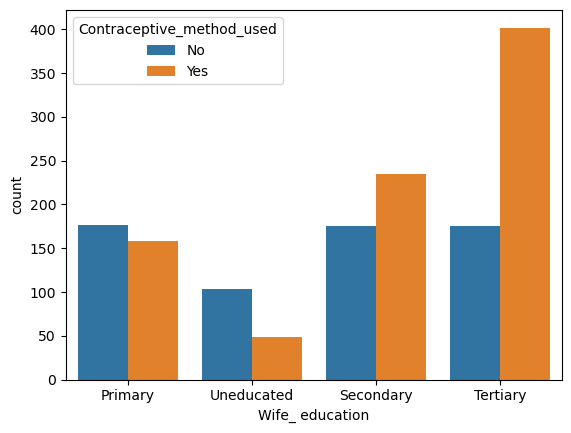

In [58]:
sns.countplot(data=df1 , x='Wife_ education',hue='Contraceptive_method_used')

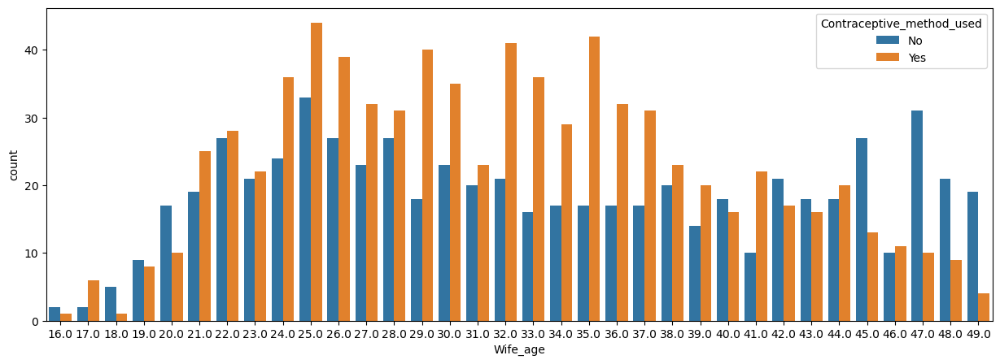

In [61]:
plt.figure(figsize=(15,5))
sns.countplot(data=df1, x = 'Wife_age',hue='Contraceptive_method_used')
plt.show()

In [62]:
df_1= df1.select_dtypes(include= ['float64', 'int64'])

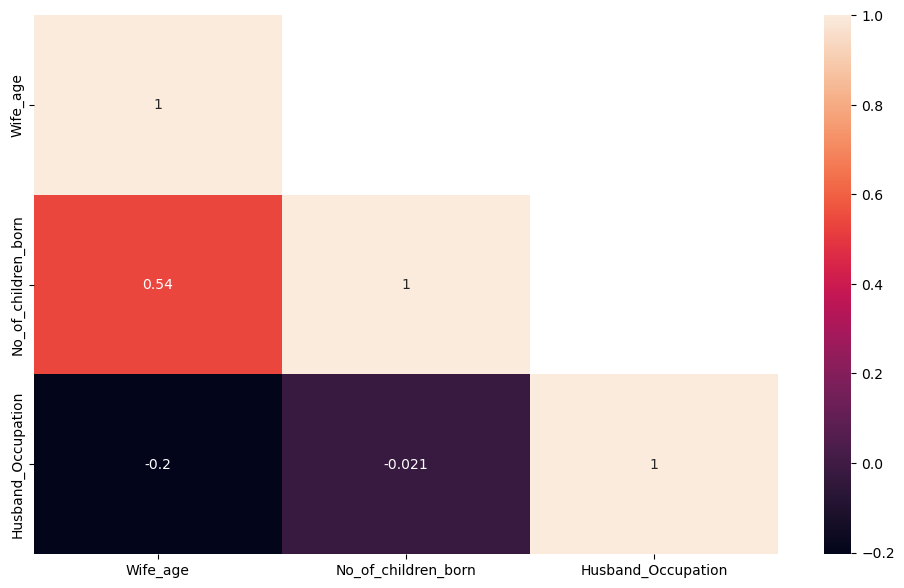

In [64]:
plt.figure(figsize=(12,7))
sns.heatmap(df_1.corr(), annot=True,mask=np.triu(df_1.corr(),+1));
plt.show()

In [65]:
dups = df1.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 80


In [66]:
print('Before',df1.shape)
df1.drop_duplicates(inplace=True) 
print('After',df1.shape)

Before (1473, 10)
After (1393, 10)


In [67]:
dups = df1.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


In [68]:
for feature in df1.columns: 
    if df1[feature].dtype == 'object': 
        print(feature)
        print(df1[feature].value_counts())
        print('\n')

Wife_ education
Wife_ education
Tertiary      515
Secondary     398
Primary       330
Uneducated    150
Name: count, dtype: int64


Husband_education
Husband_education
Tertiary      827
Secondary     347
Primary       175
Uneducated     44
Name: count, dtype: int64


Wife_religion
Wife_religion
Scientology        1186
Non-Scientology     207
Name: count, dtype: int64


Wife_Working
Wife_Working
No     1043
Yes     350
Name: count, dtype: int64


Standard_of_living_index
Standard_of_living_index
Very High    618
High         419
Low          227
Very Low     129
Name: count, dtype: int64


Media_exposure 
Media_exposure 
Exposed        1284
Not-Exposed     109
Name: count, dtype: int64


Contraceptive_method_used
Contraceptive_method_used
Yes    779
No     614
Name: count, dtype: int64




Data Pre-processing
--

In [69]:
for feature in df1.columns:
    if df1[feature].dtype=='object':
        print('feature',feature)
        print(pd.Categorical(df1[feature].unique()))
        print(pd.Categorical(df1[feature].unique()).codes)
        df1[feature]=pd.Categorical(df1[feature]).codes  

feature Wife_ education
['Primary', 'Uneducated', 'Secondary', 'Tertiary']
Categories (4, object): ['Primary', 'Secondary', 'Tertiary', 'Uneducated']
[0 3 1 2]
feature Husband_education
['Secondary', 'Primary', 'Tertiary', 'Uneducated']
Categories (4, object): ['Primary', 'Secondary', 'Tertiary', 'Uneducated']
[1 0 2 3]
feature Wife_religion
['Scientology', 'Non-Scientology']
Categories (2, object): ['Non-Scientology', 'Scientology']
[1 0]
feature Wife_Working
['No', 'Yes']
Categories (2, object): ['No', 'Yes']
[0 1]
feature Standard_of_living_index
['High', 'Very High', 'Low', 'Very Low']
Categories (4, object): ['High', 'Low', 'Very High', 'Very Low']
[0 2 1 3]
feature Media_exposure 
['Exposed', 'Not-Exposed']
Categories (2, object): ['Exposed', 'Not-Exposed']
[0 1]
feature Contraceptive_method_used
['No', 'Yes']
Categories (2, object): ['No', 'Yes']
[0 1]


In [70]:
df1.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,0,1,3.0,1,0,2,0,0,0
1,45.0,3,1,10.0,1,0,3,2,0,0
2,43.0,0,1,7.0,1,0,3,2,0,0
3,42.0,1,0,9.0,1,0,3,0,0,0
4,36.0,1,1,8.0,1,0,3,1,0,0


In [71]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1326 non-null   float64
 1   Wife_ education            1393 non-null   int8   
 2   Husband_education          1393 non-null   int8   
 3   No_of_children_born        1372 non-null   float64
 4   Wife_religion              1393 non-null   int8   
 5   Wife_Working               1393 non-null   int8   
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   int8   
 8   Media_exposure             1393 non-null   int8   
 9   Contraceptive_method_used  1393 non-null   int8   
dtypes: float64(2), int64(1), int8(7)
memory usage: 53.1 KB


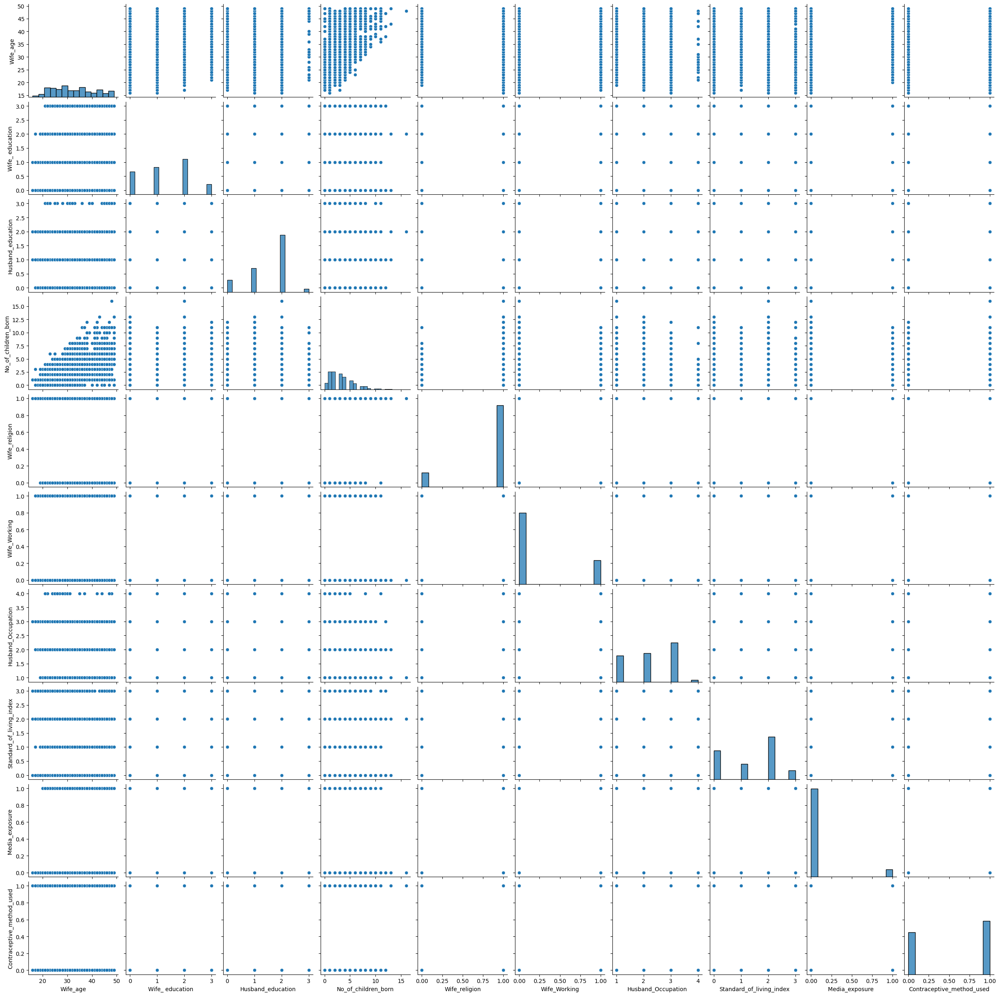

In [72]:
sns.pairplot(df1)

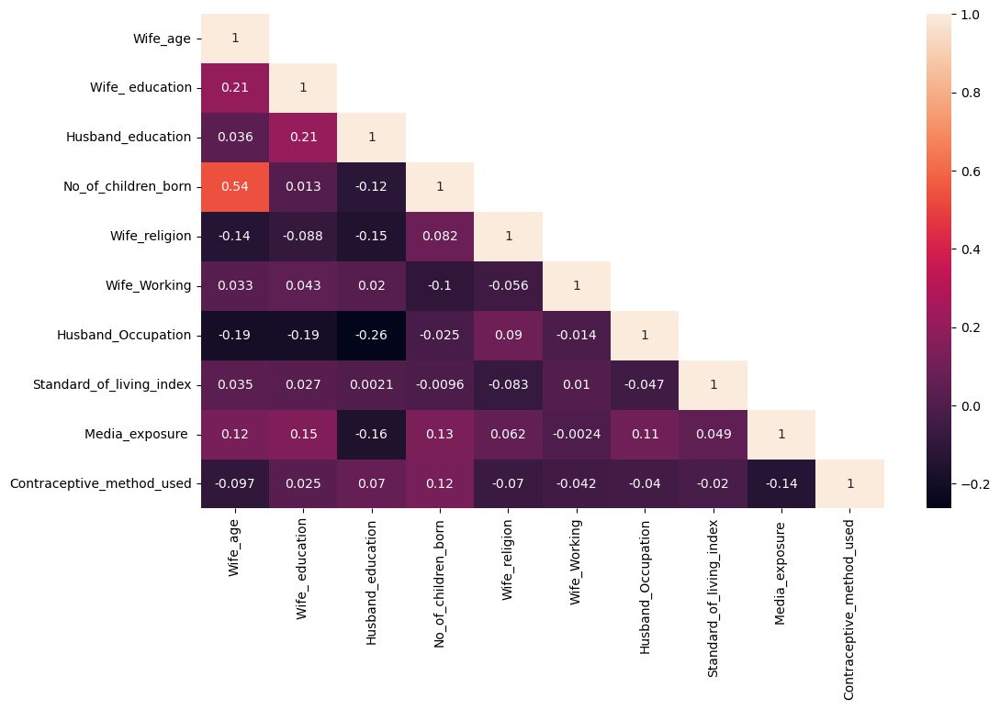

In [73]:
plt.figure(figsize=(12,7))
sns.heatmap(df1.corr(), annot=True,mask=np.triu(df1.corr(),+1));
plt.show()

checking the missing values
---

In [74]:
df1.isnull().sum()

Wife_age                     67
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [75]:
mean = df1['Wife_age'].mean()
df1['Wife_age'] = df1['Wife_age'].replace(np.nan,mean)

In [76]:
mean = df1['No_of_children_born'].mean()
df1['No_of_children_born']=df1['No_of_children_born'].replace(np.nan,mean)
df1.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

We can see we have null values for ‘Wife_age’ and ‘No_of_children_born’, As it is a continuous variable,mean value can be imputed

Outliers treatment
---

<Axes: >

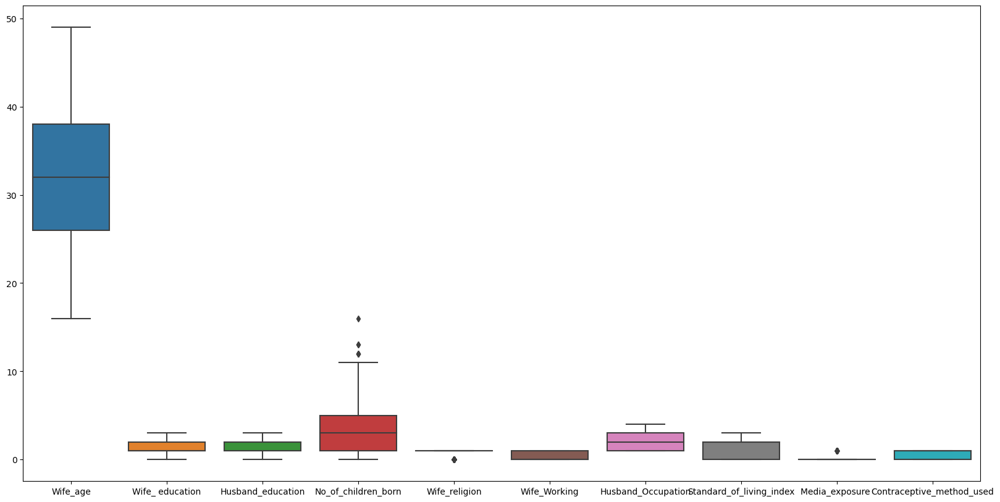

In [77]:
plt.figure(figsize=(20,10))
sns.boxplot(data=df1)

In [78]:
def get_lower_upper_ranges(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [79]:
for column in df1.columns:
    lr,ur=get_lower_upper_ranges(df1[column])
    df1[column]=np.where(df1[column]>ur,ur,df1[column])
    df1[column]=np.where(df1[column]<lr,lr,df1[column])

<Axes: >

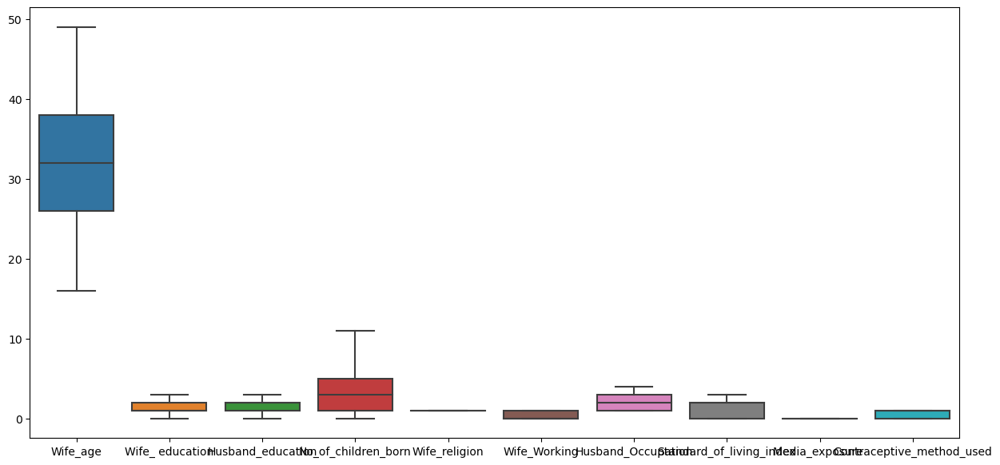

In [80]:
plt.figure(figsize=(15,7))
sns.boxplot(data=df1)

Train test split
---

In [81]:
X = df1.drop('Contraceptive_method_used',axis=1)

y = df1['Contraceptive_method_used']

In [82]:
# Split X and y into training and test set in 70:30 ratio
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=1)

In [83]:
y_train.value_counts()

Contraceptive_method_used
1.0    553
0.0    422
Name: count, dtype: int64

In [84]:
y_test.value_counts()

Contraceptive_method_used
1.0    226
0.0    192
Name: count, dtype: int64

Build a Logistic Regression model
----

In [85]:
# Fit the model on original data i.e. before upsampling
from sklearn.linear_model import LogisticRegression
# Fit the Logistic Regression model
model = LogisticRegression(solver='newton-cg',max_iter=10000,penalty='none',verbose=True,n_jobs=2)
model.fit(X_train, y_train)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    1.6s finished


LogisticRegression(max_iter=10000, n_jobs=2, penalty='none', solver='newton-cg',
                   verbose=True)

In [86]:
ytrain_predict = model.predict(X_train)
ytest_predict = model.predict(X_test)

In [87]:
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.270229,0.729771
1,0.492754,0.507246
2,0.482132,0.517868
3,0.356902,0.643098
4,0.287105,0.712895


In [88]:
model.score(X_train, y_train)

0.6533333333333333

AUC and ROC for the training data
--------

AUC: 0.668


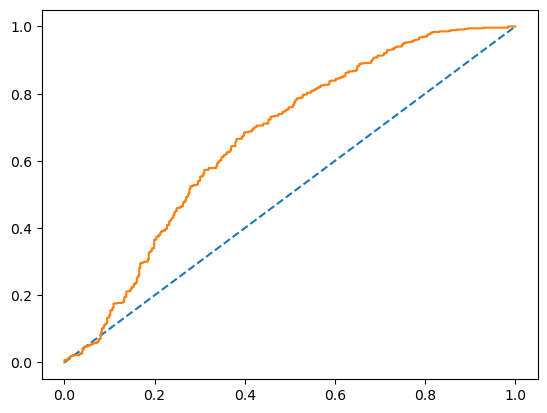

In [90]:
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay

probs = model.predict_proba(X_train)
probs = probs[:, 1]

# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

In [91]:
# Accuracy - Test Data
model.score(X_test, y_test)

0.6100478468899522

### AUC and ROC for the test data

AUC: 0.668


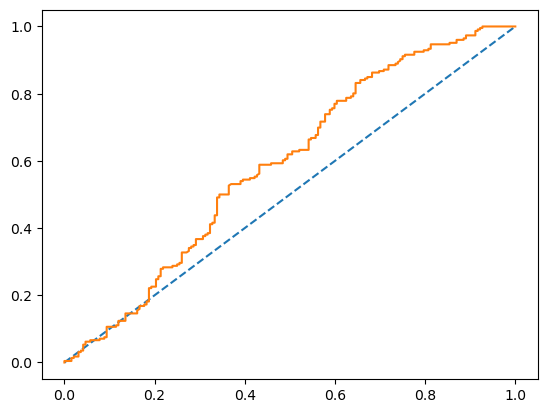

In [92]:
# predict probabilities
probs = model.predict_proba(X_test)

# keep probabilities for the positive outcome only
probs = probs[:, 1]

# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)

# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

#Logistic Regression Model Accuracy of Training data before applying GridSearchCV: 0.6533333333333333

#Logistic Regression Model Accuracy of Test data before applying GridSearchCV:0.610047846889952

### Confusion Matrix for the training data

In [93]:
confusion_matrix(y_train, ytrain_predict)

array([[187, 235],
       [103, 450]], dtype=int64)

In [94]:
cm = confusion_matrix(y_train, ytrain_predict)
cm

array([[187, 235],
       [103, 450]], dtype=int64)

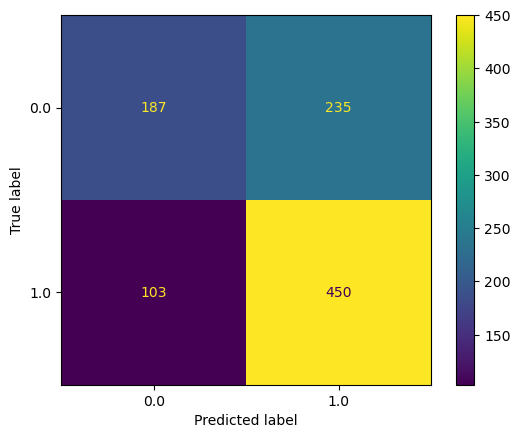

In [95]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [96]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

         0.0       0.64      0.44      0.53       422
         1.0       0.66      0.81      0.73       553

    accuracy                           0.65       975
   macro avg       0.65      0.63      0.63       975
weighted avg       0.65      0.65      0.64       975



### Confusion Matrix for test data

In [97]:
confusion_matrix(y_test, ytest_predict)

array([[ 64, 128],
       [ 35, 191]], dtype=int64)

In [98]:
cm1 = confusion_matrix(y_test, ytest_predict)
cm1

array([[ 64, 128],
       [ 35, 191]], dtype=int64)

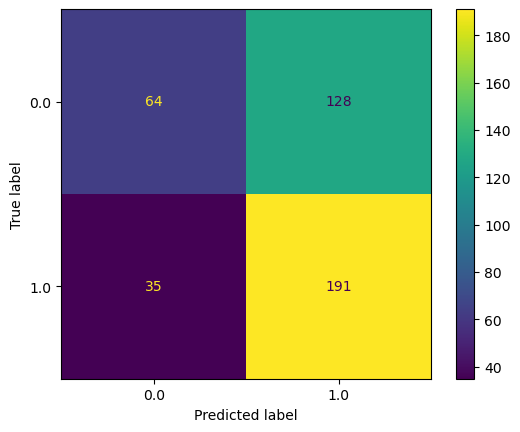

In [99]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm1, display_labels=model.classes_)
disp.plot()

In [100]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

         0.0       0.65      0.33      0.44       192
         1.0       0.60      0.85      0.70       226

    accuracy                           0.61       418
   macro avg       0.62      0.59      0.57       418
weighted avg       0.62      0.61      0.58       418



#Logistic Regression Model Accuracy of Training data before applying GridSearchCV: 0.6646153846153846

#Logistic Regression Model Accuracy of Test data before applying GridSearchCV: 0.645933014354067

### Applying GridSearchCV for Logistic Regression

In [101]:
grid={'penalty':['l2','none'],
      'solver':['sag','lbfgs'],
      'tol':[0.0001,0.00001]}

In [102]:
model = LogisticRegression(max_iter=10000,n_jobs=2)

In [103]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 3,n_jobs=-1,scoring='f1')

In [104]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=10000, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l2', 'none'], 'solver': ['sag', 'lbfgs'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1')

In [105]:
best_model = grid_search.best_estimator_

In [106]:
# Prediction on the training set
ytrain_predict = best_model.predict(X_train)
ytest_predict = best_model.predict(X_test)

In [107]:
ytest_predict_prob=best_model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.270500,0.729500
1,0.492770,0.507230
2,0.482013,0.517987
3,0.356647,0.643353
4,0.286797,0.713203


In [108]:
cm1 = confusion_matrix(y_train, ytrain_predict)
cm1

array([[187, 235],
       [103, 450]], dtype=int64)

              precision    recall  f1-score   support

         0.0       0.64      0.44      0.53       422
         1.0       0.66      0.81      0.73       553

    accuracy                           0.65       975
   macro avg       0.65      0.63      0.63       975
weighted avg       0.65      0.65      0.64       975
 



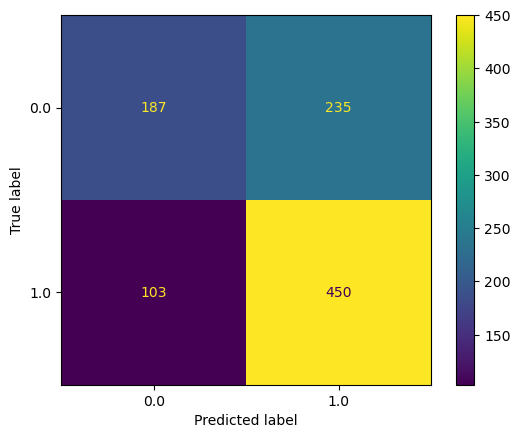

In [109]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()
print(classification_report(y_train, ytrain_predict),'\n');

              precision    recall  f1-score   support

         0.0       0.65      0.33      0.44       192
         1.0       0.60      0.85      0.70       226

    accuracy                           0.61       418
   macro avg       0.62      0.59      0.57       418
weighted avg       0.62      0.61      0.58       418
 



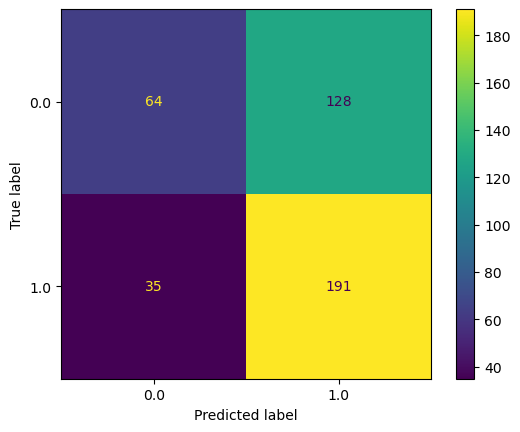

In [110]:
cm = confusion_matrix(y_test, ytest_predict)
cm
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()
print(classification_report(y_test, ytest_predict),'\n');

In [111]:
from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(y_test, ytest_predict).ravel()

In [112]:
tn,fp,fn,tp

(64, 128, 35, 191)

In [113]:
(tp+tn)/(tp+tn+fp+fn)

0.6100478468899522

In [114]:
tp/(tp+fp)

0.5987460815047022

In [115]:
tp/(tp+fn)

0.8451327433628318

Logistic Regression Model Accuracy of Training data after applying GridSearchCV: 0.65

Logistic Regression Model Accuracy of Test data after applying GridSearchCV: 0.61

### LDA Model

In [116]:
X = df1.drop('Contraceptive_method_used',axis=1)
Y = df1.pop('Contraceptive_method_used')

In [117]:
Y.value_counts()

Contraceptive_method_used
1.0    779
0.0    614
Name: count, dtype: int64

In [118]:
from sklearn import metrics,model_selection
X_train,X_test,Y_train,Y_test = model_selection.train_test_split(X,Y,test_size=0.30,random_state=1,stratify = Y)

In [119]:
from sklearn.preprocessing import StandardScaler
stand_scal = StandardScaler()
X_train = stand_scal.fit_transform(X_train)
X_test = stand_scal.transform (X_test)

In [120]:
clf = LinearDiscriminantAnalysis()
model=clf.fit(X_train,Y_train)

In [121]:
pred_class_train = model.predict(X_train)
pred_class_test = model.predict(X_test)

### Training Data and Test Data Confusion Matrix Comparison

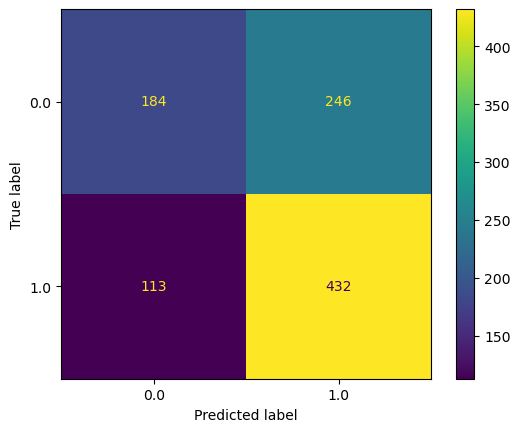

In [122]:
cm = confusion_matrix(Y_train, pred_class_train)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

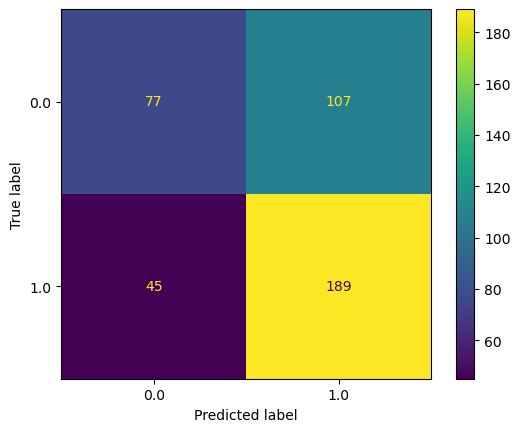

In [123]:
cm = confusion_matrix(Y_test, pred_class_test)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [124]:
print('Classification Report of the training data:\n\n',metrics.classification_report(Y_train,pred_class_train),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(Y_test,pred_class_test),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

         0.0       0.62      0.43      0.51       430
         1.0       0.64      0.79      0.71       545

    accuracy                           0.63       975
   macro avg       0.63      0.61      0.61       975
weighted avg       0.63      0.63      0.62       975
 

Classification Report of the test data:

               precision    recall  f1-score   support

         0.0       0.63      0.42      0.50       184
         1.0       0.64      0.81      0.71       234

    accuracy                           0.64       418
   macro avg       0.63      0.61      0.61       418
weighted avg       0.64      0.64      0.62       418
 



In [125]:
# Training Data Probability Prediction
pred_prob_train = model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test = model.predict_proba(X_test)

AUC for the Training Data: 0.656
AUC for the Test Data: 0.610


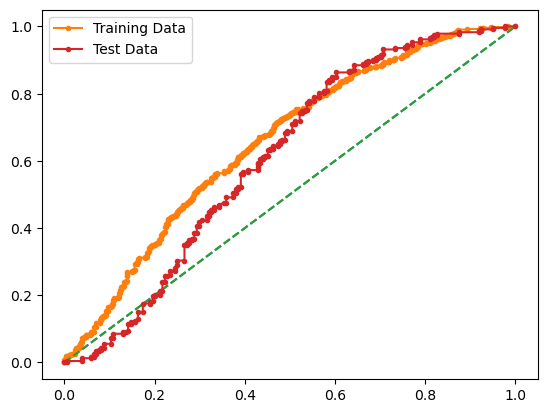

In [126]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(Y_train,pred_prob_train[:,1])
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_train,pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(Y_test,pred_prob_test[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(Y_test,pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')

# show the plot
plt.legend(loc='best')
plt.show()

In [127]:
#intercept value
clf.intercept_

array([0.25732464])

In [128]:
clf.coef_

array([[-5.40952520e-01,  1.16001921e-01,  3.23429350e-01,
         6.32846623e-01,  7.78969208e-17, -3.53171842e-02,
        -5.34161169e-02,  4.49044888e-02,  0.00000000e+00]])

### CART Model

In [129]:
from sklearn.model_selection import train_test_split

X_train, X_test, train_labels, test_labels = train_test_split(X, y, test_size=.30, random_state=1)

In [130]:
train_labels.value_counts(normalize=True)

Contraceptive_method_used
1.0    0.567179
0.0    0.432821
Name: proportion, dtype: float64

In [131]:
test_labels.value_counts(normalize=True)

Contraceptive_method_used
1.0    0.54067
0.0    0.45933
Name: proportion, dtype: float64

In [132]:
# Initialise a Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(criterion = 'gini', random_state=1)

In [133]:
dt_model.fit(X_train, train_labels)

DecisionTreeClassifier(random_state=1)

In [134]:
from sklearn import tree

train_char_label = ['No', 'Yes']
ld_Tree_File = open('C://Users//Sai Ganesh//OneDrive//Documents//pratice_cart_tree//_tree.dot','w')
dot_data = tree.export_graphviz(dt_model, 
                                out_file=ld_Tree_File, 
                                feature_names = list(X_train), 
                                class_names = list(train_char_label))

ld_Tree_File.close()

In [135]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values('Imp',ascending=False))

                               Imp
Wife_age                  0.329858
No_of_children_born       0.243001
Wife_ education           0.103865
Standard_of_living_index  0.099093
Husband_Occupation        0.094475
Husband_education         0.067645
Wife_Working              0.062064
Wife_religion             0.000000
Media_exposure            0.000000


### Predicting Test Data

In [136]:
y_predict = dt_model.predict(X_test)

In [137]:
y_predict.shape

(418,)

In [138]:
from sklearn.model_selection import GridSearchCV

param_grid = {'max_features': ['auto', 'sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [1,5,10,15,20],
              'min_samples_leaf':[1,5,10,15,20],
              'criterion' :['gini', 'entropy']
             }
tree_clas = DecisionTreeClassifier(random_state=1024)
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, train_labels)

Fitting 5 folds for each of 450 candidates, totalling 2250 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1024),
             param_grid={'ccp_alpha': [0.1, 0.01, 0.001],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 5, 10, 15, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 5, 10, 15, 20]},
             verbose=True)

In [139]:
grid_search.best_estimator_

DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=10,
                       max_features='sqrt', min_samples_leaf=5,
                       random_state=1024)

In [140]:
reg_dt_model = DecisionTreeClassifier( ccp_alpha=0.001,criterion='entropy', max_depth=10,
                       max_features='sqrt', min_samples_leaf=5,
                           random_state=1024)
reg_dt_model.fit(X_train, train_labels)

DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=10,
                       max_features='sqrt', min_samples_leaf=5,
                       random_state=1024)

In [141]:
ld_tree_regularized = open('C://Users//Sai Ganesh//OneDrive//Documents//pratice_cart_tree//_New_tree.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= ld_tree_regularized , feature_names = list(X_train), class_names = list(train_char_label))

ld_tree_regularized.close()
dot_data

In [142]:
print (pd.DataFrame(reg_dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values('Imp',ascending=False))

                               Imp
Wife_age                  0.383287
No_of_children_born       0.371703
Wife_ education           0.134980
Husband_education         0.041338
Standard_of_living_index  0.031207
Wife_Working              0.023168
Husband_Occupation        0.014317
Wife_religion             0.000000
Media_exposure            0.000000


In [143]:
ytrain_predict = reg_dt_model.predict(X_train)
ytest_predict = reg_dt_model.predict(X_test)

In [144]:
ytest_predict

array([1., 1., 1., 1., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 1., 0.,
       1., 0., 0., 1., 1., 1., 1., 0., 1., 0., 0., 1., 1., 0., 1., 1., 0.,
       1., 1., 0., 1., 0., 1., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0.,
       1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 1., 1., 1.,
       0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0.,
       1., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1.,
       1., 1., 1., 1., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 0., 1., 0.,
       0., 1., 0., 0., 1., 1., 0., 0., 1., 1., 1., 1., 1., 0., 0., 1., 0.,
       1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 1., 1., 0., 1., 1., 1., 0.,
       0., 1., 0., 1., 0., 1., 1., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 0., 0., 0., 1., 1., 0., 1., 0., 1., 0., 0., 0., 1., 0., 1.,
       1., 1., 1., 0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 1., 1., 1.,
       0., 0., 0., 0., 0., 1., 1., 0., 0., 1., 1., 1., 1., 1., 1., 0., 1.,
       1., 0., 1., 0., 1.

In [145]:
ytest_predict_prob=reg_dt_model.predict_proba(X_test)
ytest_predict_prob

array([[0.15      , 0.85      ],
       [0.375     , 0.625     ],
       [0.32432432, 0.67567568],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.53846154, 0.46153846],
       [0.54545455, 0.45454545],
       [0.73913043, 0.26086957],
       [0.83333333, 0.16666667],
       [0.38271605, 0.61728395],
       [0.71428571, 0.28571429],
       [0.7       , 0.3       ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.0483871 , 0.9516129 ],
       [1.        , 0.        ],
       [0.375     , 0.625     ],
       [0.88888889, 0.11111111],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.38271605, 0.61728395],
       [0.0483871 , 0.9516129 ],
       [0.14285714, 0.85714286],
       [0.85714286, 0.14285714],
       [0.38271605, 0.61728395],
       [0.5       , 0.5       ],
       [0.54545455, 0.45454545],
       [0.23076923, 0.76923077],
       [0.25714286, 0.74285714],
       [1.

In [146]:
 pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.150000,0.850000
1,0.375000,0.625000
2,0.324324,0.675676
3,0.000000,1.000000
4,0.000000,1.000000


AUC: 0.858


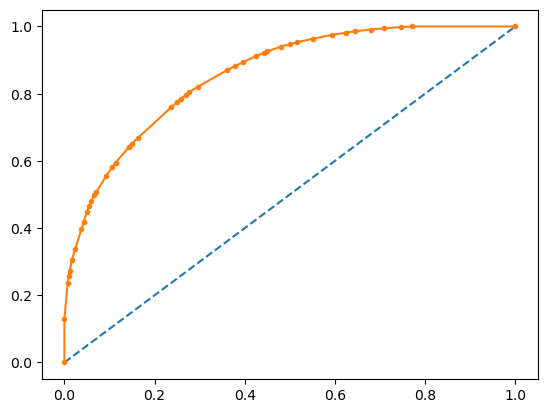

In [147]:
# predict probabilities
probs = reg_dt_model.predict_proba(X_train)

# keep probabilities for the positive outcome only
probs = probs[:, 1]

# calculate AUC
auc = roc_auc_score(train_labels, probs)
print('AUC: %.3f' % auc)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(train_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')

# show the plot
plt.show()

AUC: 0.667


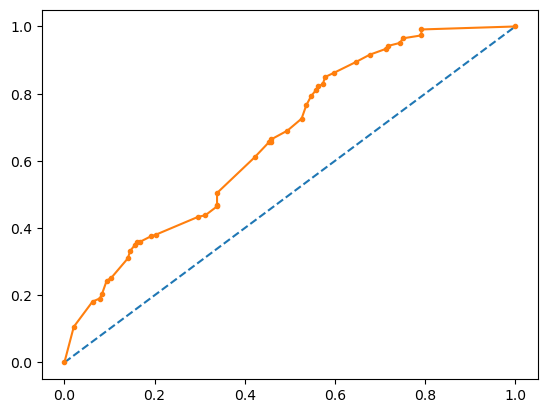

In [148]:
# predict probabilities
probs = reg_dt_model.predict_proba(X_test)

# keep probabilities for the positive outcome only
probs = probs[:, 1]

# calculate AUC
auc = roc_auc_score(test_labels, probs)
print('AUC: %.3f' % auc)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(test_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')

# show the plot
plt.show()

In [149]:
confusion_matrix(train_labels, ytrain_predict)

array([[297, 125],
       [ 99, 454]], dtype=int64)

In [150]:
#Train Data Accuracy
reg_dt_model.score(X_train,train_labels) 

0.7702564102564102

In [151]:
print((454+297)/(297+125+99+454))

0.7702564102564102


In [152]:
print(classification_report(train_labels, ytrain_predict))

              precision    recall  f1-score   support

         0.0       0.75      0.70      0.73       422
         1.0       0.78      0.82      0.80       553

    accuracy                           0.77       975
   macro avg       0.77      0.76      0.76       975
weighted avg       0.77      0.77      0.77       975



### Confusion Matrix for test data

In [153]:
confusion_matrix(test_labels, ytest_predict)

array([[104,  88],
       [ 76, 150]], dtype=int64)

In [154]:
(150+104)/(104+88+76+150)

0.6076555023923444

In [155]:
#Test Data Accuracy
reg_dt_model.score(X_test,test_labels)

0.6076555023923444

In [156]:
print(classification_report(test_labels, ytest_predict))

              precision    recall  f1-score   support

         0.0       0.58      0.54      0.56       192
         1.0       0.63      0.66      0.65       226

    accuracy                           0.61       418
   macro avg       0.60      0.60      0.60       418
weighted avg       0.61      0.61      0.61       418



### Conclusion
Accuracy on the Training Data: 77%

Accuracy on the Test Data: 61%

AUC on the Training Data: 85%

AUC on the Test Data: 66%

Business Insights & Recommendations
----------------
The EDA analysis clearly indicates that women with a tertiary education and very high standard ofliving used contraceptive methods Women ranging from 21 to 38 generally use contraceptive methods more

#The usage of contraceptive methods need not depend on their demographic or socioeconomicbackgrounds since the use of contraceptive methods were almost the same for both working and non-working women

#The use of contraceptive method was high for both Scientology and Non-scientology women